# Курсовая работа № 2
## Аналитика. Начальный уровень

Курсовая работа состоит из двух частей – обязательной и дополнительной. **Для зачета необходимо выполнение только первой части.** Выполнение второй части может потребовать дополнительные знания Python.

- [Часть первая](#Часть-первая)
- [Часть вторая](#Часть-вторая)

## Часть первая


Перед вами стоит задача – подготовить аналитический отчет для HR-отдела. На основании проведенной аналитики предполагается составить рекомендации для отдела кадров по стратегии набора персонала, а также по взаимодействию с уже имеющимися сотрудниками.
<br><br> В базе данных лежит набор таблиц, которые содержат данные о сотрудниках вымышленной компании.
Сделайте обзор штата сотрудников компании. Составьте набор предметов исследования, а затем проверьте их на данных. Вся аналитика должна быть выполена с помощью SQL. Впоследствии данные можно визуализировать, однако финальные датафреймы для графиков также должны быть подготовлены с помощью SQL. <br><br>

Примеры гипотез:
1. Есть зависимость между `perfomance score` и тем, под чьим руководством работает сотрудник.
2. Есть зависимость между продолжительностью работы в компании и семейным положением сотрудника.
2. Есть зависимость между продолжительностью работы в компании и возрастом сотрудника.

<br><br>
Таблицы, доступные для анализа, – `hr_dataset`, `production_staff`, `recruiting_costs`, `salary_grid`.

#### Оценка эффективности системы управления персоналом.  
Методика располагается по адресу: https://zen.yandex.ru/media/id/5d6c2784394b2a00ada927ab/obzor-sistem-ocenki-effektivnosti-upravleniia-personalom-5d7202cfd4f07a00aed9f741

##### 1. Отбор и найм:  
• Скорость закрытия вакансий;  
• Средний стаж сотрудников;  
• Процент работников, прошедших испытательный срок;  
• Процент обращений кандидатов из компаний-конкурентов;  
• Выполнение плана по набору персонала;  
• Общее время простоя незаполненных вакансий;  
• Количество закрытых вакансий;  
• Методы привлечения работников;  
• Соблюдение технологии набора.  

##### 2. Обучение и развитие:  
• Выполнение плана по обучению;  
• Оценка участников;  
• Оценка по тесту на знания;  
• Поведенческие изменения;  
• Изменение производственных (финансовых) показателей;  
• Процент сотрудников, прошедших аттестацию с высокими оценками;  
• ROI.  

##### 3. Оклады и премии:  
• Абсолютный и относительный фонд оплаты труда (ФОТ);  
• ФОТ и показатели прибыли, продаж, штатной численности, объема работ;  
• Процент сотрудников, уволившихся из-за неудовлетворенности оплатой труда;  
• Абсолютное и относительное количество жалоб и конфликтов по оплате труда;  
• Индекс удовлетворенности сотрудников в целом;  
• Текучка среди сотрудников с высокими аттестационными оценками.  

##### 5. Эффективность работы с кадровым резервом:  
• Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве, относительно общего количества закрытых вакансий;  
• Количество мероприятий по обучению для сотрудников, состоящих в кадровом резерве, относительно общего количества мероприятий по обучению;  
• Количество назначений на новые должности сотрудников, состоявших в кадровом резерве, относительно общего количества резервистов.  

##### 6. Общая эффективность кадровых ресурсов.  
• Относительные расходы на персонал (прибыль, продажи, себестоимость);  
• Сбои и потери по вине сотрудников;  
• Оценка Клиентами сотрудников компании в целом;  
• Общая текучесть персонала;  
• Незапланированная текучесть персонала;  
• Доходы на одного сотрудника.  

Так как, некоторые данные отсутствуют, то выполнить все пункты у нас - не получится.

In [30]:
### YOUR CODE HERE ###

#Подключаем, нужные для работы, библиотеки.

import psycopg2
import numpy as np
import pandas as pd
import sqlite3
import matplotlib
from matplotlib import pyplot as plt

In [31]:
#Создаём подключение и курсор.

pg_connection = {
    "host": "some_host",
    "port": some_port,
    "dbname": "some_dbname",
    "user": "some_user",
    "password": "some_pass"
}
conn = psycopg2.connect(**pg_connection)
cursor = conn.cursor()

In [32]:
#Знакомимся с данными.

df_hr_dataset = pd.read_sql_query("select * from public.hr_dataset limit 5;", conn, index_col='id')
with pd.option_context('display.max_columns', None):
    display(df_hr_dataset)

,Employee Name,Employee Number,marriedid,maritalstatusid,genderid,empstatus_id,deptid,perf_scoreid,age,Pay Rate,state,zip,dob,sex,maritaldesc,citizendesc,Hispanic/Latino,racedesc,Date of Hire,Days Employed,Date of Termination,Reason For Term,Employment Status,department,position,Manager Name,Employee Source,Performance Score
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,"Brown, Mia",1103024456,1,1,0,1,1,3,30,28.50,MA,1450,1987-11-24,Female,Married,US Citizen,No,Black or African American,2008-10-27,3317,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Diversity Job Fair,Fully Meets
2,"LaRotonda, William",1106026572,0,2,1,1,1,3,34,23.00,MA,1460,1984-04-26,Male,Divorced,US Citizen,No,Black or African American,2014-01-06,1420,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Website Banner Ads,Fully Meets
3,"Steans, Tyrone",1302053333,0,0,1,1,1,3,31,29.00,MA,2703,1986-09-01,Male,Single,US Citizen,No,White,2014-09-29,1154,None,N/A - still employed,Active,Admin Offices,Accountant I,Brandon R. LeBlanc,Internet Search,Fully Meets
4,"Howard, Estelle",1211050782,1,1,0,1,1,9,32,21.50,MA,2170,1985-09-16,Female,Married,US Citizen,No,White,2015-02-16,58,2015-04-15,N/A - still employed,Active,Admin Offices,Administrative Assistant,Brandon R. LeBlanc,Pay Per Click - Google,N/A- too early to review
5,"Singh, Nan",1307059817,0,0,0,1,1,9,30,16.56,MA,2330,1988-05-19,Female,Single,US Citizen,No,White,2015-05-01,940,None,N/A - still employed,Active,Admin Offices,Administrative Assistant,Brandon R. LeBlanc,Website Banner Ads,N/A- too early to review


In [33]:
df_production_staff = pd.read_sql_query("select * from public.production_staff limit 5;", conn, index_col='id')
df_production_staff

,Employee Name,Race Desc,Date of Hire,TermDate,Reason for Term,Employment Status,Department,Position,Pay,Manager Name,Performance Score,Abutments/Hour Wk 1,Abutments/Hour Wk 2,Daily Error Rate,90-day Complaints
id,,,,,,,,,,,,,,,
1,"Albert, Michael",White,2011-08-01,None,N/A - still employed,Active,Production,Production Manager,$54.50,Elisa Bramante,Fully Meets,0,0,0,0
2,"Bozzi, Charles",Asian,2013-09-30,2014-08-07,retiring,Voluntarily Terminated,Production,Production Manager,$50.50,Elisa Bramante,Fully Meets,0,0,0,0
3,"Butler, Webster L",White,2016-01-28,None,N/A - still employed,Active,Production,Production Manager,$55.00,Elisa Bramante,Exceeds,0,0,0,0
4,"Dunn, Amy",White,2014-09-18,None,N/A - still employed,Active,Production,Production Manager,$51.00,Elisa Bramante,Fully Meets,0,0,0,0
5,"Gray, Elijiah",White,2015-06-02,None,N/A - still employed,Active,Production,Production Manager,$54.00,Elisa Bramante,Fully Meets,0,0,0,0


In [34]:
df_recruiting_costs = pd.read_sql_query("select * from public.recruiting_costs limit 5;", conn, index_col='id')
df_recruiting_costs

,Employment Source,January,February,March,April,May,June,July,August,September,October,November,December,Total
id,,,,,,,,,,,,,,
1,Billboard,520,520,520,520,0,0,612,612,729,749,910,500,6192
2,Careerbuilder,410,410,410,820,820,410,410,820,820,1230,820,410,7790
3,Company Intranet - Partner,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Diversity Job Fair,0,5129,0,0,0,0,0,4892,0,0,0,0,10021
5,Employee Referral,0,0,0,0,0,0,0,0,0,0,0,0,0


In [35]:
df_salary_grid = pd.read_sql_query("select * from public.salary_grid limit 5;", conn, index_col='id')
df_salary_grid

,Position,Salary Min,Salary Mid,Salary Max,Hourly Min,Hourly Mid,Hourly Max
id,,,,,,,
1,Administrative Assistant,30000,40000,50000,14.42,19.23,24.04
2,Sr. Administrative Assistant,35000,45000,55000,16.83,21.63,26.44
3,Accountant I,42274,51425,62299,20.32,24.72,29.95
4,Accountant II,50490,62158,74658,24.27,29.88,35.89
5,Sr. Accountant,63264,76988,92454,30.42,37.01,44.45


In [36]:
#Начинаем исследование на основании указанной методики.

#1. Отбор и найм:
#• Скорость закрытия вакансий

#Создаём датафрейм.
sql_str = '''SELECT EXTRACT(YEAR FROM "Date of Hire") AS year, EXTRACT(MONTH FROM "Date of Hire") AS month, COUNT(*)
             FROM hr_dataset GROUP BY EXTRACT(YEAR FROM "Date of Hire"), EXTRACT(MONTH FROM "Date of Hire")
             ORDER BY EXTRACT(YEAR FROM "Date of Hire"), EXTRACT(MONTH FROM "Date of Hire");'''
df_job_clos_rate = pd.read_sql_query(sql_str, conn)
df_job_clos_rate[['year', 'month']] = df_job_clos_rate[['year', 'month']].astype(int)
df_job_clos_rate

,year,month,count
0,2006,1,1
1,2007,6,1
2,2007,11,1
3,2008,1,1
4,2008,9,1
...,...,...,...
64,2016,9,1
65,2016,10,2
66,2017,1,1
67,2017,2,3


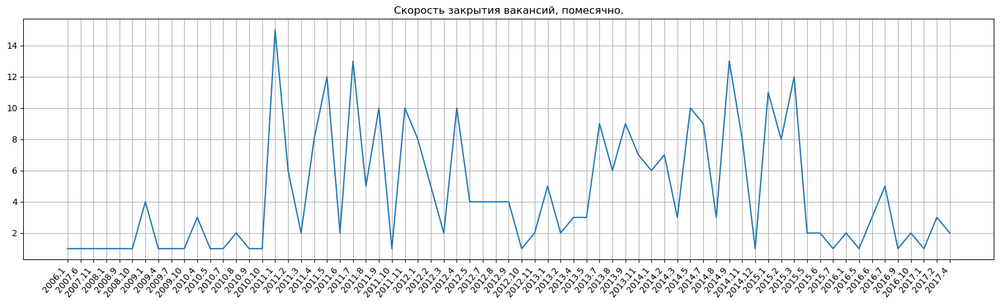

In [37]:
#Чертим график.

x_labels = []
for line in df_job_clos_rate.iterrows():
    x_labels.append(f'{line[1][0]}.{line[1][1]}')
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
ax.plot(df_job_clos_rate.index, df_job_clos_rate['count'])
ax.set_title('Скорость закрытия вакансий, помесячно.')
ax.set_xticks(df_job_clos_rate.index)
ax.set_xticklabels(x_labels, rotation=50, ha='right')
ax.grid()
plt.show()

In [38]:
#• Средний стаж сотрудников

#Определяем уникальные значения поля "Employment Status" в таблице hr_dataset.
sql_str = 'SELECT DISTINCT "Employment Status" FROM hr_dataset;'
cursor.execute(sql_str)
unique_ES = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "Employment Status":\n{unique_ES}')

print('\n')

#Определяем средний стаж.
sql_str = '''SELECT AVG("Days Employed") FROM hr_dataset WHERE "Employment Status" = \'Active\'
             OR "Employment Status" = \'Leave of Absence\';'''
cursor.execute(sql_str)
sr_DE = cursor.fetchall()[0][0]
print(f'Средний стаж сотрудников: {round(sr_DE)} дней.')

Уникальные значения поля "Employment Status":
['Future Start', 'Voluntarily Terminated', 'Active', 'Terminated for Cause', 'Leave of Absence']


Средний стаж сотрудников: 1607 дней.


In [39]:
#• Процент работников, прошедших испытательный срок

#Определим "старшую" дату в "Date of Hire"
df_hr_dataset_fs = pd.read_sql_query('SELECT * FROM hr_dataset WHERE "Employment Status" = \'Future Start\';', conn\
                                     , index_col='id')
df_hr_dataset_fs

,Employee Name,Employee Number,marriedid,maritalstatusid,genderid,empstatus_id,deptid,perf_scoreid,age,Pay Rate,...,Date of Hire,Days Employed,Date of Termination,Reason For Term,Employment Status,department,position,Manager Name,Employee Source,Performance Score
id,,,,,,,,,,,,,,,,,,,,,
45,"Carr, Claudia N",1010022337,0,0,0,2,3,9,31,61.30,...,2016-06-30,514,None,N/A - Has not started yet,Future Start,IT/IS,Sr. DBA,Simon Roup,Vendor Referral,N/A- too early to review
50,"Semizoglou, Jeremiah",904013591,1,1,1,2,3,9,35,53.80,...,2016-06-30,514,None,N/A - Has not started yet,Future Start,IT/IS,Sr. Network Engineer,Peter Monroe,On-campus Recruiting,N/A- too early to review
91,"Clukey, Elijian",1407069280,1,1,1,2,5,4,37,24.75,...,2016-07-06,508,None,N/A - Has not started yet,Future Start,Production,Production Technician I,Brannon Miller,Employee Referral,Exceeds
95,"Crimmings, Jean",1311063172,0,0,0,2,5,9,31,19.75,...,2016-07-06,508,None,N/A - Has not started yet,Future Start,Production,Production Technician I,Michael Albert,Newspager/Magazine,N/A- too early to review
178,"Saar-Beckles, Melinda",1410070998,0,0,0,2,5,9,50,20.00,...,2016-07-04,510,None,N/A - Has not started yet,Future Start,Production,Production Technician I,Kelley Spirea,Diversity Job Fair,N/A- too early to review
197,"Von Massenbach, Anna",1106026474,0,0,0,2,5,9,33,20.00,...,2015-07-05,875,None,N/A - Has not started yet,Future Start,Production,Production Technician I,Michael Albert,Newspager/Magazine,N/A- too early to review
205,"Beak, Kimberly",1303054329,1,1,0,2,5,4,52,27.00,...,2016-07-21,493,None,N/A - Has not started yet,Future Start,Production,Production Technician II,Kelley Spirea,Employee Referral,Exceeds
226,"Hunts, Julissa",1106026433,0,0,0,2,5,9,34,25.00,...,2016-06-06,538,None,N/A - Has not started yet,Future Start,Production,Production Technician II,Elijiah Gray,Vendor Referral,N/A- too early to review
227,"Hutter, Rosalie",1103024924,0,3,0,2,5,9,26,28.00,...,2015-06-05,905,None,N/A - Has not started yet,Future Start,Production,Production Technician II,Webster Butler,Other,N/A- too early to review


In [40]:
#Видно, что самая "старшая" дата у сотрудников с "Employment Status" Future Start - 2015-06-05. На основании этого, находим
#искомый процент.

sql_str = 'SELECT COUNT(*) FROM hr_dataset WHERE "Date of Hire" >= \'2015-06-01\';'
cursor.execute(sql_str)
fs_emp = cursor.fetchall()[0][0]
print(f'Всего нанято с июня 2015-го: {fs_emp} человек')

sql_str = '''SELECT COUNT(*) FROM hr_dataset WHERE "Date of Hire" >= \'2015-06-01\'
             AND ("Employment Status" = \'Active\' OR "Employment Status" = \'Leave of Absence\');'''
cursor.execute(sql_str)
prob_end_emp = cursor.fetchall()[0][0]
print(f'Прошло испытательный срок с июня 2015-го: {prob_end_emp} человек')

prob_end_proc = prob_end_emp * 100 / fs_emp
print(f'Прошло испытательный срок с июня 2015-го: {round(prob_end_proc, 2)} процентов')

Всего нанято с июня 2015-го: 23 человек
Прошло испытательный срок с июня 2015-го: 12 человек
Прошло испытательный срок с июня 2015-го: 52.17 процентов


In [41]:
#• Количество закрытых вакансий

sql_str = '''SELECT COUNT(*) FROM hr_dataset WHERE "Employment Status" = \'Active\'
             OR "Employment Status" = \'Leave of Absence\' OR "Employment Status" = \'Future Start\';'''
cursor.execute(sql_str)
clos_vac_emp = cursor.fetchall()[0][0]
print(f'Количество закрытых вакансий: {clos_vac_emp}')

Количество закрытых вакансий: 208


In [42]:
#• Методы привлечения работников

sql_str = 'SELECT DISTINCT "Employment Source" FROM recruiting_costs;'
cursor.execute(sql_str)
print('Методы привлечения работников:', '\n')
for i in cursor.fetchall():
    print(i[0])

Методы привлечения работников: 

Billboard
Pay Per Click
Other
Social Networks - Facebook Twitter etc
Search Engine - Google Bing Yahoo
Professional Society
Pay Per Click - Google
Word of Mouth
Glassdoor
Vendor Referral
Diversity Job Fair
MBTA ads
Information Session
Company Intranet - Partner
On-line Web application
Newspager/Magazine
Careerbuilder
Website Banner Ads
On-campus Recruiting
Internet Search
Monster.com
Employee Referral


In [43]:
#2. Обучение и развитие
#• Оценка участников

#Определяем уникальные значения поля "Performance Score" в таблице hr_dataset.
sql_str = 'SELECT DISTINCT "Performance Score" FROM hr_dataset;'
cursor.execute(sql_str)
unique_ps = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "Performance Score":\n{unique_ps}')

print('\n')

#Определяем оценки.
sql_str = '''SELECT "Performance Score", COUNT(*) FROM hr_dataset WHERE "Employment Status" = \'Active\' 
             OR "Employment Status" = \'Leave of Absence\' GROUP BY "Performance Score";'''
df_perf_score = pd.read_sql_query(sql_str, conn)
print('Оценки участников:')
display(df_perf_score)

Уникальные значения поля "Performance Score":
['Exceptional', '90-day meets', 'N/A- too early to review', 'Fully Meets', 'Exceeds', 'PIP', 'Needs Improvement']


Оценки участников:


,Performance Score,count
0,Exceptional,9
1,90-day meets,18
2,N/A- too early to review,15
3,Fully Meets,125
4,Exceeds,18
5,PIP,5
6,Needs Improvement,7


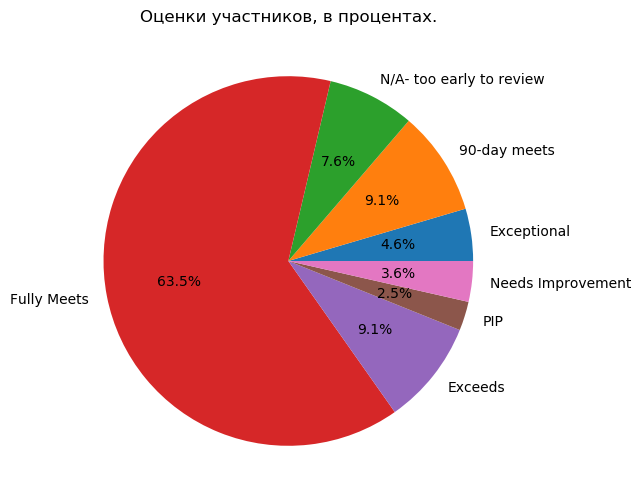

In [44]:
#• Процент сотрудников, прошедших аттестацию с высокими оценками

plt.figure(figsize=(6, 6))
plt_perf_score = plt.pie(df_perf_score['count'], labels=df_perf_score['Performance Score'], autopct='%1.1f%%')
plt.title('Оценки участников, в процентах.')
plt.show()

In [45]:
#3. Оклады и премии
#• Абсолютный и относительный фонд оплаты труда (ФОТ)

#Абсолютный фонд считаем по максимальной часовой ставке за должность, которую берём из таблицы salary_grid.
sql_str = '''SELECT SUM(total_salary) FROM (SELECT hr_dataset."Employee Name", hr_dataset.department
             , hr_dataset.position, salary_grid."Hourly Max" , hr_dataset."Days Employed"
             ,(hr_dataset."Days Employed" * 8 * salary_grid."Hourly Max") AS total_salary 
             FROM hr_dataset, salary_grid WHERE hr_dataset.position = salary_grid."Position") AS ts;'''
cursor.execute(sql_str)
afot = round(cursor.fetchall()[0][0], 2)
print(f'Абсолютный фонд оплаты труда: {afot} $')

#Относительный фонд считаем по часовой ставке сотрудника.
sql_str = '''SELECT SUM(total_salary) FROM (SELECT "Employee Name", department, position, "Pay Rate", "Days Employed"
             ,("Days Employed" * 8 * "Pay Rate") AS total_salary FROM hr_dataset) AS ts;'''
cursor.execute(sql_str)
ofot = round(cursor.fetchall()[0][0], 2)
print(f'Относительный фонд оплаты труда: {ofot} $')

Абсолютный фонд оплаты труда: 62398901.09 $
Относительный фонд оплаты труда: 101855039.06 $


In [46]:
#Исследуем несоответсвие, полученное в результате расчётов.

df_hr_dataset_1 = pd.read_sql_query("select * from hr_dataset ORDER BY id DESC LIMIT 5;", conn, index_col='id')
df_salary_grid_1 = pd.read_sql_query("select * from salary_grid;", conn, index_col='id')
display(df_hr_dataset_1)
display(df_salary_grid_1)

,Employee Name,Employee Number,marriedid,maritalstatusid,genderid,empstatus_id,deptid,perf_scoreid,age,Pay Rate,...,Date of Hire,Days Employed,Date of Termination,Reason For Term,Employment Status,department,position,Manager Name,Employee Source,Performance Score
id,,,,,,,,,,,,,,,,,,,,,
310,"Hubert, Robert",1009920000,1,1,1,1,3,3,28,45.00,...,2017-04-20,220,None,N/A - still employed,Active,IT/IS,BI Developer,Brian Champaigne,Indeed,Fully Meets
309,"Westinghouse, Matthew",1009919990,1,1,1,1,3,3,30,45.00,...,2017-04-20,220,None,N/A - still employed,Active,IT/IS,BI Developer,Brian Champaigne,Indeed,Fully Meets
308,"Smith, Jason",1009919980,0,0,1,1,3,3,34,46.00,...,2017-02-15,284,None,N/A - still employed,Active,IT/IS,BI Developer,Brian Champaigne,Indeed,Fully Meets
307,"Wang, Charlie",1009919970,0,0,1,1,3,3,36,51.00,...,2017-02-15,284,None,N/A - still employed,Active,IT/IS,Senior BI Developer,Brian Champaigne,Indeed,Fully Meets
306,"Navathe, Kurt",1009919960,0,0,1,1,3,3,48,52.25,...,2017-02-10,289,None,N/A - still employed,Active,IT/IS,Senior BI Developer,Brian Champaigne,Indeed,Fully Meets


,Position,Salary Min,Salary Mid,Salary Max,Hourly Min,Hourly Mid,Hourly Max
id,,,,,,,
1,Administrative Assistant,30000,40000,50000,14.42,19.23,24.04
2,Sr. Administrative Assistant,35000,45000,55000,16.83,21.63,26.44
3,Accountant I,42274,51425,62299,20.32,24.72,29.95
4,Accountant II,50490,62158,74658,24.27,29.88,35.89
5,Sr. Accountant,63264,76988,92454,30.42,37.01,44.45
6,Network Engineer,50845,66850,88279,24.44,32.14,42.44
7,Sr. Network Engineer,79428,99458,120451,38.19,47.82,57.91
8,Database Administrator,50569,68306,93312,24.31,32.84,44.86
9,Sr. DBA,92863,116007,139170,44.65,55.77,66.91


In [47]:
#Видно, что есть должности не описанные в зарплатной сетке.

#Добавим в "абсолютный фонд" сотрудников, не попавших в первое вычисление.
sql_str = '''SELECT SUM(total_salary) FROM (SELECT "Employee Name", department, position, "Pay Rate" , "Days Employed"
             ,("Days Employed" * 8 * "Pay Rate") AS total_salary FROM hr_dataset 
             WHERE position NOT IN (SELECT hr_dataset.position FROM hr_dataset, salary_grid
             WHERE hr_dataset.position = salary_grid."Position")) AS ts;'''
cursor.execute(sql_str)
afot_not_grid = round(cursor.fetchall()[0][0], 2)

#Рассчитаем правильные фонды оплаты.
print(f'Фонд оплаты, не отражённый в зарплатной сетке: {afot_not_grid} $')
print(f'Абсолютный фонд оплаты труда: {round(afot + afot_not_grid, 2)} $')
print(f'Относительный фонд оплаты труда: {ofot} $')

Фонд оплаты, не отражённый в зарплатной сетке: 49227467.93 $
Абсолютный фонд оплаты труда: 111626369.02 $
Относительный фонд оплаты труда: 101855039.06 $


In [48]:
#• Процент сотрудников, уволившихся из-за неудовлетворенности оплатой труда

#Определяем уникальные значения поля "Reason For Term" в таблице hr_dataset.
sql_str = 'SELECT DISTINCT "Reason For Term" FROM hr_dataset;'
cursor.execute(sql_str)
unique_RfT = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "Reason For Term":\n{unique_RfT}')

print('\n')

sql_str = 'SELECT COUNT(*) FROM hr_dataset WHERE "Employment Status" IN (\'Voluntarily Terminated\', \'Terminated for Cause\');'
cursor.execute(sql_str)
number_dism = cursor.fetchall()[0][0]
print(f'Количество уволенных: {number_dism} человек')

sql_str = '''SELECT COUNT(*) FROM hr_dataset WHERE "Employment Status" IN (\'Voluntarily Terminated\'
             , \'Terminated for Cause\') AND "Reason For Term" = \'more money\';'''
cursor.execute(sql_str)
number_dism_money = cursor.fetchall()[0][0]
print(f'Уволившиеся из-за неудовлетворенности оплатой труда: {number_dism_money} человек')

number_dism_money_p = number_dism_money * 100 / number_dism
print(f'Уволившиеся из-за неудовлетворенности оплатой труда: {round(number_dism_money_p, 2)} процентов')

Уникальные значения поля "Reason For Term":
['N/A - Has not started yet', 'attendance', 'more money', 'medical issues', 'maternity leave - did not return', 'return to school', 'relocation out of area', 'performance', 'gross misconduct', 'military', 'hours', 'career change', 'unhappy', 'retiring', 'Another position', 'no-call, no-show', 'N/A - still employed']


Количество уволенных: 102 человек
Уволившиеся из-за неудовлетворенности оплатой труда: 11 человек
Уволившиеся из-за неудовлетворенности оплатой труда: 10.78 процентов


In [49]:
#• Текучка среди сотрудников с высокими аттестационными оценками.

# Формула для расчёта: КТК = (УСЖ + УИР) х 100 / СЧ, где
#КТК – коэффициент текучести кадров;
#УСЖ – количество уволенных по собственному желанию сотрудников;
#УИР – число уволенных работников по инициативе руководства (за прогулы, по судимости, нарушение дисциплины и пр.);
#СЧ – среднесписочная численность сотрудников за период отчета.

sql_str = '''SELECT COUNT(*) FROM hr_dataset WHERE "Reason For Term" NOT IN (\'N/A - Has not started yet\'
                                                    , \'military\', \'retiring\', \'N/A - still employed\')
             AND "Performance Score" IN (\'Exceptional\', \'Exceeds\');'''
cursor.execute(sql_str)
usj_uir = cursor.fetchall()[0][0]
print(f'УСЖ + УИР: {usj_uir} человек')

total_emp_ps = df_perf_score[df_perf_score['Performance Score'].isin(['Exceptional', 'Exceeds'])]['count'].sum()
print(f'Кадры с высокими аттестационными оценками: {total_emp_ps} человек')

ktk = usj_uir * 100 / total_emp_ps
print(f'Коэффициент текучести кадров с высокими аттестационными оценками: {round(ktk, 2)}')

УСЖ + УИР: 7 человек
Кадры с высокими аттестационными оценками: 27 человек
Коэффициент текучести кадров с высокими аттестационными оценками: 25.93


In [50]:
#4. Общая эффективность HR службы

#Определяем уникальные значения поля "department" в таблице hr_dataset.
sql_str = 'SELECT DISTINCT department FROM hr_dataset'
cursor.execute(sql_str)
unique_dep = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "department":\n{unique_dep}')

print('\n')

#Определяем уникальные значения поля "Department" в таблице production_staff.
sql_str = 'SELECT DISTINCT "Department" FROM production_staff'
cursor.execute(sql_str)
unique_dep_prod = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "Department":\n{unique_dep_prod}')

#Ищем сотрудников hr-службы среди офисных сотрудников.
sql_str = '''SELECT "Employee Name", department, position, "Performance Score" FROM hr_dataset 
             WHERE department IN (\'Admin Offices\', \'Executive Office\');'''
df_hr_dataset_hr = pd.read_sql_query(sql_str, conn)
display(df_hr_dataset_hr)

print('\n')

#Определяем уникальные значения поля "position" в таблице hr_dataset.
sql_str = 'SELECT DISTINCT position FROM hr_dataset'
cursor.execute(sql_str)
unique_pos = [a[0] for a in cursor.fetchall()]
print(f'Уникальные значения поля "position":\n{unique_pos}')

Уникальные значения поля "department":
['Production       ', 'Admin Offices', 'IT/IS', 'Executive Office', 'Software Engineering', 'Sales']


Уникальные значения поля "Department":
[None, 'Production       ']


,Employee Name,department,position,Performance Score
0,"Brown, Mia",Admin Offices,Accountant I,Fully Meets
1,"LaRotonda, William",Admin Offices,Accountant I,Fully Meets
2,"Steans, Tyrone",Admin Offices,Accountant I,Fully Meets
3,"Howard, Estelle",Admin Offices,Administrative Assistant,N/A- too early to review
4,"Singh, Nan",Admin Offices,Administrative Assistant,N/A- too early to review
5,"Smith, Leigh Ann",Admin Offices,Administrative Assistant,Fully Meets
6,"LeBlanc, Brandon R",Admin Offices,Shared Services Manager,Fully Meets
7,"Quinn, Sean",Admin Offices,Shared Services Manager,Fully Meets
8,"Boutwell, Bonalyn",Admin Offices,Sr. Accountant,90-day meets
9,"Foster-Baker, Amy",Admin Offices,Sr. Accountant,Fully Meets




Уникальные значения поля "position":
['IT Support', 'Database Administrator', 'Software Engineering Manager', 'Production Manager', 'Senior BI Developer', 'Shared Services Manager', 'BI Developer', 'CIO', 'Sales Manager', 'Sr. DBA', 'Network Engineer', 'Area Sales Manager', 'Administrative Assistant', 'Data Architect', 'IT Manager - DB', 'IT Manager - Infra', 'IT Director', 'Production Technician I', 'BI Director', 'Software Engineer', 'Sr. Network Engineer', 'Director of Sales', 'President & CEO', 'Sr. Accountant', 'Production Technician II', 'IT Manager - Support', 'Director of Operations', 'Accountant I']


In [51]:
#Сотрудников HR-службы не наблюдается. Можем, только, посчитать бюджет.

#• Абсолютный и относительный бюджет HR службы.

sql_str = 'SELECT SUM("Total") FROM recruiting_costs;'
cursor.execute(sql_str)
total_bud = cursor.fetchall()[0][0]
print(f'Абсолютный бюджет HR службы: {round(total_bud, 2)} $')

#Создаём вспомогательные view для подсчёта относительного бюджета.
sql_str = '''CREATE VIEW es_dep AS
             SELECT "Employee Source", department, count(*) FROM hr_dataset GROUP BY "Employee Source", department
             ORDER BY "Employee Source", department;'''
cursor.execute(sql_str)

sql_str = '''CREATE VIEW es AS
             SELECT "Employee Source", count(*) AS total_count FROM hr_dataset GROUP BY "Employee Source"
             ORDER BY "Employee Source";'''
cursor.execute(sql_str)

sql_str = '''CREATE VIEW es_cost AS
             SELECT es."Employee Source", es.total_count , (CAST(recruiting_costs."Total" AS REAL) / es.total_count) AS cost
             FROM es, recruiting_costs WHERE es."Employee Source" = recruiting_costs."Employment Source";'''
cursor.execute(sql_str)

#Создаём датафрейм для подсчёта относительного бюджета
sql_str = '''SELECT es_dep."Employee Source", es_dep.department, es_dep.count
                    , (ROUND(CAST(es_cost.cost * es_dep.count AS DECIMAL), 2)) AS relative_budget
             FROM es_dep, es_cost WHERE es_dep."Employee Source" = es_cost."Employee Source"
             ORDER BY es_dep."Employee Source", es_dep.department;'''
df_hr_dataset_es_dep = pd.read_sql_query(sql_str, conn)

#Удаляем вспомогательные view
sql_str = 'DROP VIEW es_dep CASCADE;'
cursor.execute(sql_str)

sql_str = 'DROP VIEW es CASCADE;'
cursor.execute(sql_str)

Абсолютный бюджет HR службы: 84460 $


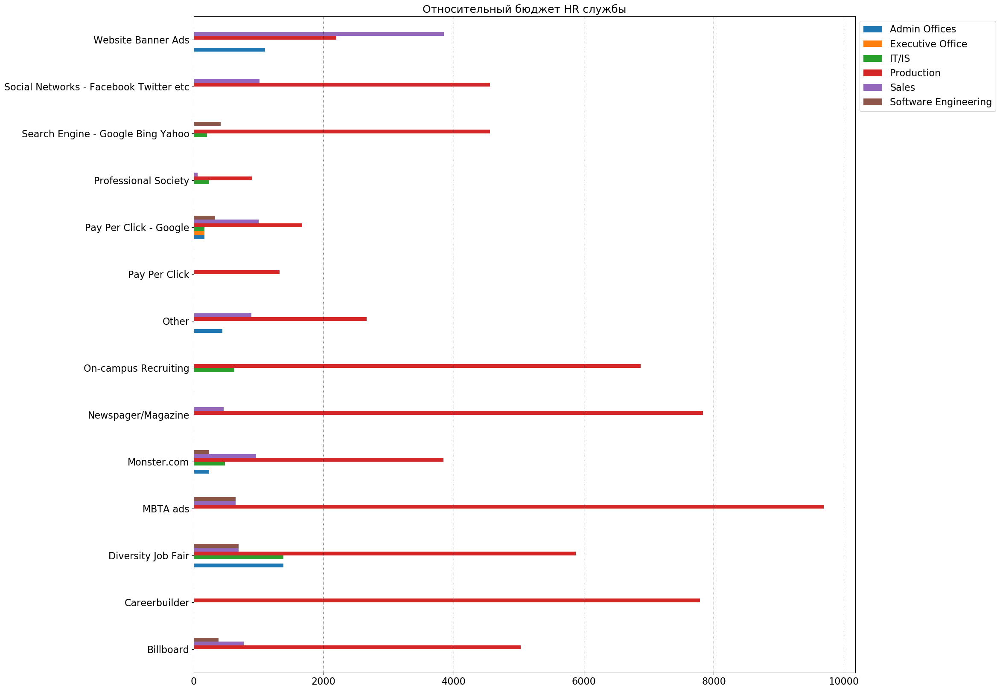

In [52]:
#Доводим датафрейм.
df_hr_dataset_es_dep_dia = df_hr_dataset_es_dep[['Employee Source', 'department', 'relative_budget']]\
                           [df_hr_dataset_es_dep['relative_budget'] > 0].set_index(['Employee Source', 'department'])\
                           .unstack('department').fillna(0)

#Рисуем график.
plot = df_hr_dataset_es_dep_dia.plot.barh(
        figsize=(20,20)
        , fontsize=16
        , title='Относительный бюджет HR службы')
plot.title.set_size(18)
handles, labels = plot.get_legend_handles_labels()
leg_labels = []
for lab in labels:
    leg_labels.append(lab[18:-1])
plot.legend(handles=handles, labels=leg_labels, loc=1, bbox_to_anchor=(1.22, 1), fontsize=16)
plot.set(ylabel=None, xlabel=None)
plot.grid(axis='x', color = 'black', linestyle = ':')
plt.show()

In [53]:
#5. Эффективность работы с кадровым резервом
#• Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве, относительно общего количества закрытых
#вакансий.

sql_str = 'SELECT COUNT(*) FROM hr_dataset WHERE "Employee Source" = \'Company Intranet - Partner\';'
cursor.execute(sql_str)
per_res = cursor.fetchall()[0][0]
print(f'Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве: {per_res} человек')

per_res_proc = per_res * 100 / clos_vac_emp
print(f'Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве: {round(per_res_proc, 2)} процентов')

Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве: 1 человек
Количество вакансий, закрытых из сотрудников, состоящих в кадровом резерве: 0.48 процентов


In [54]:
#6. Общая эффективность кадровых ресурсов
#• Сбои и потери по вине сотрудников

#Посчитаем простои.
sql_str = 'SELECT SUM("Abutments/Hour Wk 1") FROM production_staff;'
cursor.execute(sql_str)
Abut_Wk1 = cursor.fetchall()[0][0]
print(f'Простой за текущую неделю: {Abut_Wk1} часов')

sql_str = 'SELECT SUM("Abutments/Hour Wk 2") FROM production_staff;'
cursor.execute(sql_str)
Abut_Wk2 = cursor.fetchall()[0][0]
print(f'Простой за предыдущую неделю: {Abut_Wk2} часов')

print(f'Простой за две недели: {Abut_Wk1 + Abut_Wk2} часов')

#Подготовим датафреймы для подсчёта жалоб и ошибок.
sql_str = '''SELECT "Manager Name", SUM("Abutments/Hour Wk 1" + "Abutments/Hour Wk 2") FROM production_staff
             GROUP BY "Manager Name";'''
df_prod_staff_abut = pd.read_sql_query(sql_str, conn).dropna()

sql_str = 'SELECT "Daily Error Rate", COUNT(*) FROM production_staff GROUP BY "Daily Error Rate";'
df_prod_staff_DER = pd.read_sql_query(sql_str, conn).dropna()

sql_str = 'SELECT "90-day Complaints", COUNT(*) FROM production_staff GROUP BY "90-day Complaints";'
df_prod_staff_90dC = pd.read_sql_query(sql_str, conn).dropna()

Простой за текущую неделю: 1977 часов
Простой за предыдущую неделю: 2127 часов
Простой за две недели: 4104 часов


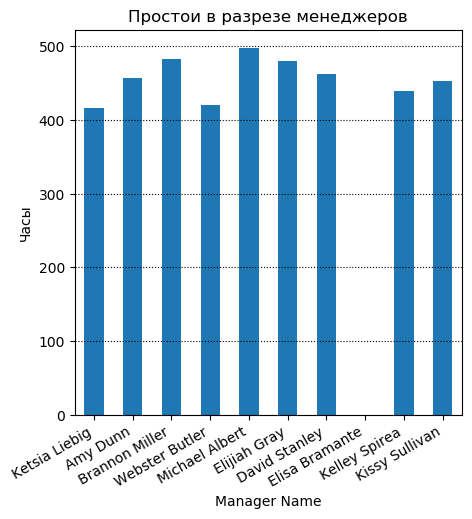

In [55]:
#Нарисуем график, из которого видно, под чьим руководством произошло самое большое количество простоев.
plot1 = df_prod_staff_abut.plot.bar('Manager Name',
        figsize=(5,5)
        , fontsize=10
        , title='Простои в разрезе менеджеров'
        , legend = None)
plt.ylabel('Часы')
plt.xticks(rotation=30, ha='right')
plt.grid(axis='y', color = 'black', linestyle = ':')
plt.show()

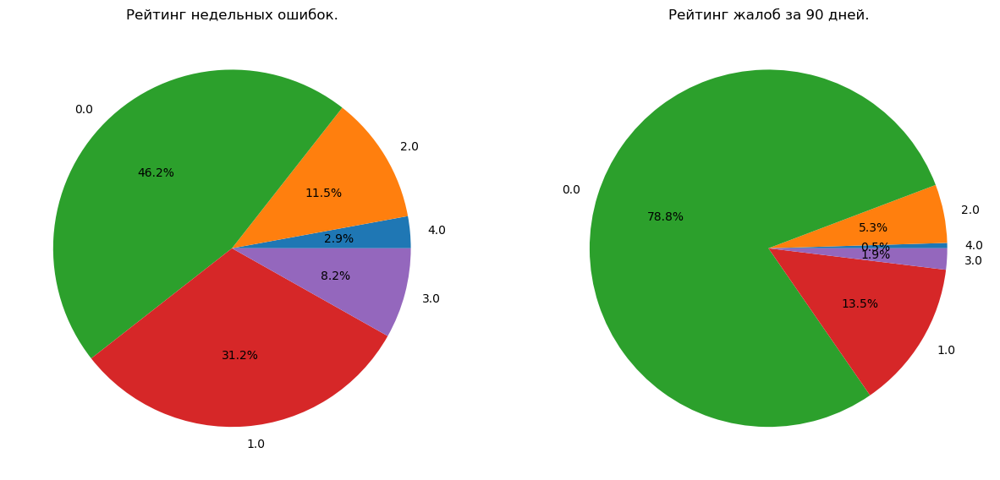

In [56]:
#Нарисуем графики, из которых видны рейтинги ошибок и жалоб.
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 15))
ax1.pie(df_prod_staff_DER['count'], labels=df_prod_staff_DER['Daily Error Rate'], autopct='%1.1f%%')
ax1.set_title('Рейтинг недельных ошибок.')
ax2.pie(df_prod_staff_90dC['count'], labels=df_prod_staff_90dC['90-day Complaints'], autopct='%1.1f%%')
ax2.set_title('Рейтинг жалоб за 90 дней.')
plt.show()

In [57]:
#• Общая текучесть персонала

print(f'УСЖ + УИР: {number_dism} человек')

sql_str = 'SELECT COUNT(*) FROM hr_dataset;'
cursor.execute(sql_str)
total_emp = cursor.fetchall()[0][0]
print(f'Среднесписочная численность: {total_emp} человек')

total_ktk = number_dism * 100 / total_emp
print(f'Коэффициент текучести кадров: {round(total_ktk, 2)}')

УСЖ + УИР: 102 человек
Среднесписочная численность: 310 человек
Коэффициент текучести кадров: 32.9


In [58]:
#• Незапланированная текучесть персонала

sql_str = '''SELECT COUNT(*) FROM hr_dataset WHERE "Reason For Term" NOT IN (\'N/A - Has not started yet\'
                                                    , \'military\', \'retiring\', \'N/A - still employed\');'''
cursor.execute(sql_str)
total_usj_uir = cursor.fetchall()[0][0]
print(f'УСЖ + УИР: {total_usj_uir} человек')

unpl_turn_ktk = total_usj_uir * 100 / total_emp
print(f'Коэффициент незапланированной текучести кадров: {round(unpl_turn_ktk, 2)}')

УСЖ + УИР: 94 человек
Коэффициент незапланированной текучести кадров: 30.32


In [59]:
#Закрываем подключение и курсор.
cursor.close()

## Часть вторая

Перед вами стоит задача – подготовить аналитический ответ для SMM-отдела компании Skillbox. <br> Объектом анализа является  [паблик Skillbox Вконтакте](https://vk.com/skillbox_education). <br> <br> 
Подключитесь к  API VK и выгрузите посты со стены паблика Skillbox за интересующий период (определите самостоятельно и обоснуйте). Проанализируйте влияние различных факторов (например, времени публикации) на вовлеченность пользователей (количество лайков, комментариев, голосов в опросах). Сделайте аналитику по рубрикам (примеры рубрик: дизайн-битва, игра по управлению), которые есть в паблике. Выбрать нужные посты можно с помощью регулярных выражений. Составьте перечень рекомендаций для SMM-отдела по итогам анализа. <br> <br> 

Дополнительные инструкции по работе с API VK расположены [здесь](https://colab.research.google.com/drive/1rRaTay-OSPLAOX8V9UaFvTiAciVtp2s3).

In [60]:
### YOUR CODE HERE ###

#Подключаем нужные библиотеки.
import requests
import numpy as np
import pandas as pd
import matplotlib
import warnings
import re
from matplotlib import pyplot as plt
from datetime import datetime, timedelta
import seaborn as sns

#Настраиваем matplotlib.
palette = plt.get_cmap('Set2')

#Отключаем уведомления.
warnings.filterwarnings('ignore')

#Указываем секретный токен.
vk_token = 'some_token'

In [61]:
#Создаём функцию для преобразования ответа сервера в json.
def getjson(url):
    response = requests.get(url)
    response = response.json()
    return response

In [62]:
#Проверяем ответ сервера.
url = 'https://api.vk.com/method/account.getProfileInfo?access_token=' + str(vk_token) + '&v=5.92'
response = getjson(url)

print(response)

{'response': {'first_name': 'Андрей', 'id': 267705256, 'last_name': 'Бабиков', 'home_town': 'Екатеринбург', 'status': 'Поставьте справа...', 'bdate': '22.1.1978', 'bdate_visibility': 1, 'city': {'id': 49, 'title': 'Екатеринбург'}, 'country': {'id': 1, 'title': 'Россия'}, 'phone': '+7 *** *** ** 12', 'relation': 4, 'screen_name': 'abisaset', 'sex': 2}}


In [63]:
#Получаем записи со стены сообщества.
url = 'https://api.vk.com/method/wall.get?access_token=' + str(vk_token) + '&owner_id=-66669811&offset=30&count=100&v=5.92'
response = getjson(url)

df_sb = pd.json_normalize(response['response']['items'])
df_sb

,id,from_id,owner_id,date,marked_as_ads,post_type,text,attachments,is_favorite,post_source.type,comments.count,comments.can_post,comments.groups_can_post,likes.count,likes.user_likes,likes.can_like,likes.can_publish,reposts.count,reposts.user_reposted,views.count
0,98024,-66669811,-66669811,1600189575,0,post,Что важнее для 3D-художника: креатив или знани...,"[{'type': 'link', 'link': {'url': 'https://ski...",False,api,2,1,True,44,0,1,1,5,0,20362
1,97908,-66669811,-66669811,1600168120,0,post,Хочется добавить в мир красок? Начните с устан...,"[{'type': 'video', 'video': {'access_key': '14...",False,api,7,1,True,209,0,1,1,14,0,26950
2,97512,-66669811,-66669811,1600101089,0,post,"Если не брифовать заказчика, добра не будет. А...","[{'type': 'link', 'link': {'url': 'https://ski...",False,api,7,1,True,92,0,1,1,16,0,22200
3,97317,-66669811,-66669811,1600078290,0,post,"Доставайте конспекты, вооружайтесь ручками, мы...","[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,23,1,True,60,0,1,1,4,0,21197
4,97265,-66669811,-66669811,1600072385,0,post,Музыкальный онлайн-редактор — как мы себе это ...,"[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,0,1,True,163,0,1,1,18,0,26430
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,85177,-66669811,-66669811,1595756248,0,post,"«Все, что нужно для съемки кино, — камера, пле...","[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,8,1,True,105,0,1,1,6,0,17331
96,85077,-66669811,-66669811,1595664017,0,post,"Накипело на самоизоляции? Кричите, будто вас н...","[{'type': 'video', 'video': {'access_key': 'c3...",False,api,20,1,True,58,0,1,1,5,0,21295
97,84967,-66669811,-66669811,1595582338,0,post,"Досадно, что во времена Наполеона, Да Винчи и ...","[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,46,1,True,254,0,1,1,15,0,41418
98,84805,-66669811,-66669811,1595511395,0,post,"Друзья, мы взяли золото и два серебра на Effie...","[{'type': 'doc', 'doc': {'id': 559837584, 'own...",False,api,6,1,True,66,0,1,1,0,0,18996


От SMM-отдела компании Skillbox пришёл запрос на аналитический отчёт за август-месяц.

In [64]:
#Переводим формат datetime в формат timestamp.
aug_1 = datetime.strptime('1/8/20', '%d/%m/%y')
aug_31 = datetime.strptime('31/8/20', '%d/%m/%y')
ts_aug_1 = datetime.timestamp(aug_1)
ts_aug_31 = datetime.timestamp(aug_31)

#Отфильтровываем записи.
df_sb_aug = df_sb[(df_sb['date'] >= ts_aug_1) & (df_sb['date'] <= ts_aug_31)]
display(df_sb_aug.head())

#Проверяем правильность интервала.
date_first = df_sb_aug.iloc[0:1, :].date.values[0]
dt_first = (datetime.fromtimestamp(date_first) - timedelta(hours=0)).strftime('%Y-%m-%d %H:%M:%S')
print(date_first)
print(dt_first)

date_second = df_sb_aug.iloc[-1:, :].date.values[0]
dt_second = (datetime.fromtimestamp(date_second) - timedelta(hours=0)).strftime('%Y-%m-%d %H:%M:%S')
print(date_second)
print(dt_second)

,id,from_id,owner_id,date,marked_as_ads,post_type,text,attachments,is_favorite,post_source.type,comments.count,comments.can_post,comments.groups_can_post,likes.count,likes.user_likes,likes.can_like,likes.can_publish,reposts.count,reposts.user_reposted,views.count
29,91986,-66669811,-66669811,1598785262,0,post,Один стилус — тысячи возможностей.\n\n3D-худож...,"[{'type': 'video', 'video': {'access_key': '79...",False,api,17,1,True,157,0,1,1,7,0,29655
30,91720,-66669811,-66669811,1598701586,0,post,Toyota следом за другими автобрендами сменила ...,"[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,30,1,True,42,0,1,1,2,0,26696
31,91639,-66669811,-66669811,1598617655,0,post,3D-дизайнер Рейчел (@rachaellic) каждый день п...,"[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,29,1,True,192,0,1,1,8,0,35867
32,91396,-66669811,-66669811,1598546446,0,post,"""Подскажите, как пройти в библиотеку?"" — что-т...","[{'type': 'link', 'link': {'url': 'https://ski...",False,api,16,1,True,61,0,1,1,7,0,21165
33,91309,-66669811,-66669811,1598526805,0,post,У кого самый высокий IQ? Кто знает все существ...,"[{'type': 'photo', 'photo': {'album_id': -7, '...",False,api,0,1,True,133,0,1,1,9,0,29145


1598785262
2020-08-30 16:01:02
1596268847
2020-08-01 13:00:47


Всё хорошо - первая и последняя записи с корректными датами.

In [65]:
#Извлекаем нужные поля.
df_sb_aug_dat = df_sb_aug[['id', 'date', 'text', 'comments.count', 'likes.count', 'reposts.count', 'views.count']]
#Приводим колонку date к типу datetime.
df_sb_aug_dat['date'] = df_sb_aug_dat['date'].apply(lambda x: datetime.fromtimestamp(x))
df_sb_aug_dat.head()

,id,date,text,comments.count,likes.count,reposts.count,views.count
29,91986,2020-08-30 16:01:02,Один стилус — тысячи возможностей.\n\n3D-худож...,17,157,7,29655
30,91720,2020-08-29 16:46:26,Toyota следом за другими автобрендами сменила ...,30,42,2,26696
31,91639,2020-08-28 17:27:35,3D-дизайнер Рейчел (@rachaellic) каждый день п...,29,192,8,35867
32,91396,2020-08-27 21:40:46,"""Подскажите, как пройти в библиотеку?"" — что-т...",16,61,7,21165
33,91309,2020-08-27 16:13:25,У кого самый высокий IQ? Кто знает все существ...,0,133,9,29145


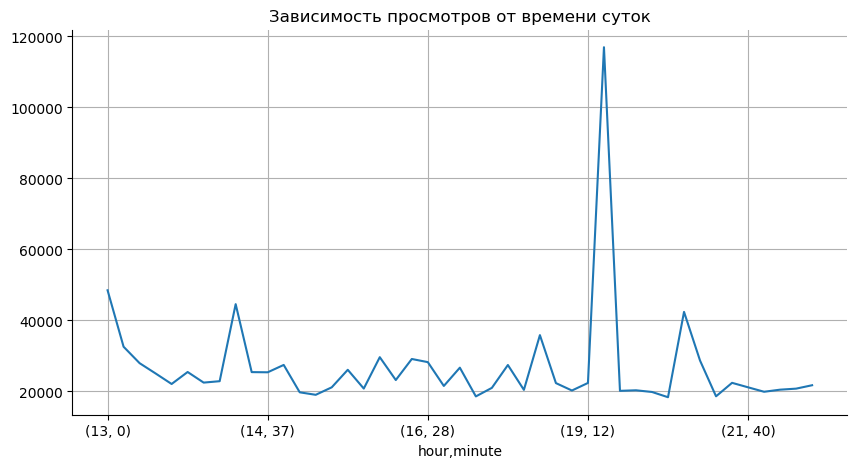

In [66]:
#Проверим зависимость просмотров от времени суток.
df_sb_aug_time_views = df_sb_aug_dat.groupby([df_sb_aug_dat['date'].dt.hour, df_sb_aug_dat['date'].dt.minute])\
                    ['views.count'].sum()
df_sb_aug_time_views.index.rename(['hour', 'minute'], inplace=True)
df_sb_aug_time_views.plot(figsize=(10,5), title='Зависимость просмотров от времени суток', legend=None)
plt.grid()
sns.despine(top=True, right=True)
plt.show()

Особой зависимости не наблюдается. Видно три всплеска выше 40 000 просмотров: в 13-00, 14-00 и 20-00; и один большой выброс,выше 100 000 просмотров, в 19-30.

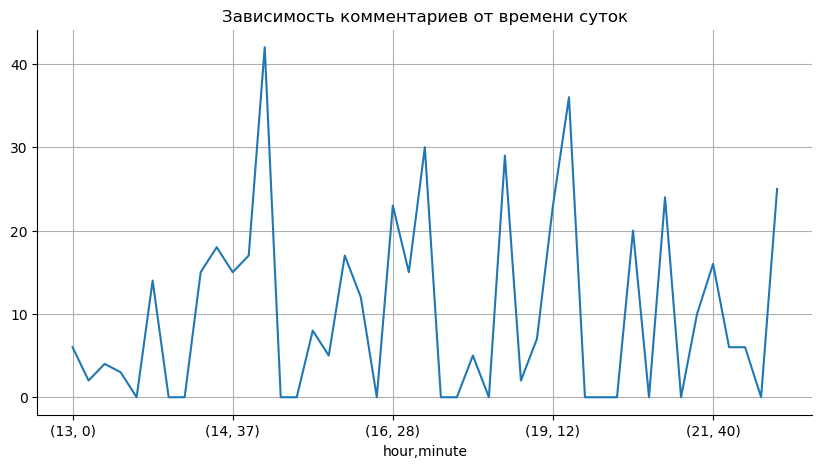

In [67]:
#Проверим зависимость комментариев от времени суток.
df_sb_aug_time_comm = df_sb_aug_dat.groupby([df_sb_aug_dat['date'].dt.hour, df_sb_aug_dat['date'].dt.minute])\
                    ['comments.count'].sum()
df_sb_aug_time_comm.index.rename(['hour', 'minute'], inplace=True)
df_sb_aug_time_comm.plot(figsize=(10,5), title='Зависимость комментариев от времени суток', legend=None)
plt.grid()
sns.despine(top=True, right=True)
plt.show()

Зависимости не наблюдается.

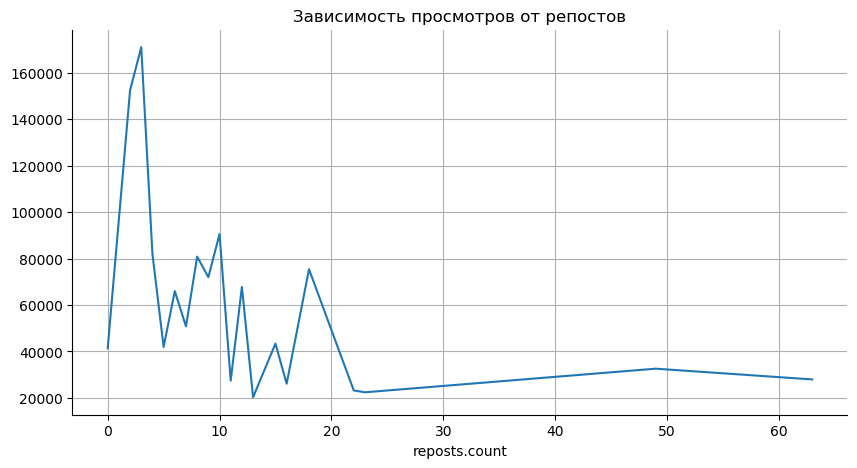

In [68]:
#Проверим зависимость просмотров от репостов.
df_sb_aug_repost_views = df_sb_aug_dat.groupby('reposts.count')['views.count'].sum()
df_sb_aug_repost_views.plot(figsize=(10,5), title='Зависимость просмотров от репостов', legend=None)
plt.grid()
sns.despine(top=True, right=True)
plt.show()

Наблюдается странная, обратная зависимость - проверим другим способом.

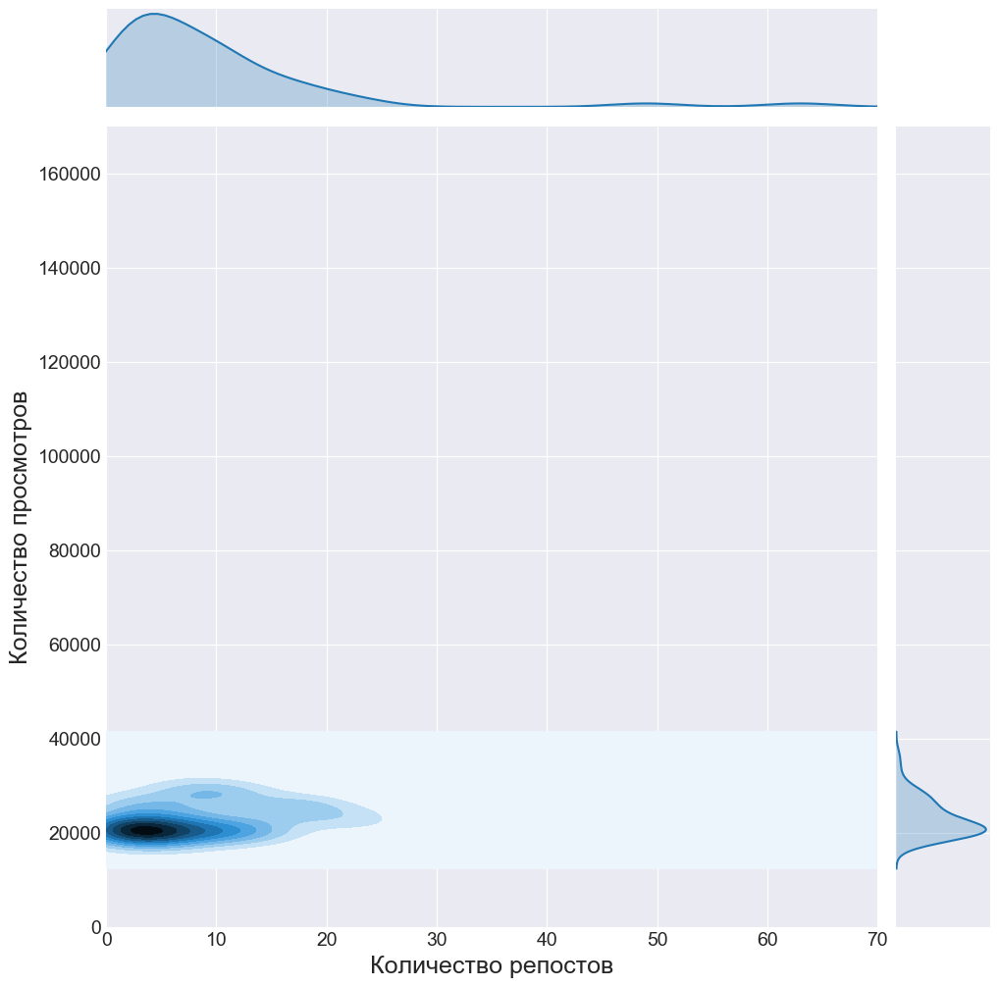

In [69]:
plt.style.use('seaborn-darkgrid')
p = sns.jointplot(x="reposts.count", y="views.count", data=df_sb_aug_dat, kind='kde', height=10, ratio=7\
                  , xlim=[0,70] , ylim=[0,170000]).set_axis_labels("Количество репостов", "Количество просмотров", size=18)
p.ax_joint.tick_params(labelsize=14)
plt.show()

Можно сделать вывод, что просмотры от репостов зависят очень-очень слабо.

In [70]:
#Проведём анализ рубрик.
#Для начала, выясним, какие рубрики существуют
tags = []
for text in df_sb_aug_dat['text']:
    for tag in re.findall(r'(#\w+)', text):
        if tag not in tags:
            tags.append(tag)
tags

['#Skillbox_дизайн',
 '#Моушн_Skillbox',
 '#Дизайн_баттл',
 '#Программирование_Skillbox',
 '#Skillbox_вдохновляет',
 '#Skillbox_Программирование',
 '#Статья_Skillbox',
 '#В_закладки_Skillbox',
 '#Skillbox_Дизайн',
 '#Skillbox_Маркетинг',
 '#Skillbox_маркетинг',
 '#Кейс_Skillbox',
 '#Расписание_Skillbox',
 '#В_Закладки_Skillbox',
 '#Конкурс_Skillbox',
 '#Лекторий_Skillbox',
 '#Skillbox_программирование',
 '#Курсы_Skillbox',
 '#в_закладки_skillbox',
 '#Skillbox_РАНХиГС',
 '#Skillbox_Мркетинг',
 '#Совет_препода_Skillbox',
 '#Skillbox_управление',
 '#Флористика_Skillbox',
 '#Шрифты_Skillbox',
 '#vktalents_bomman']

Наблюдаем дублирование некоторых рубрик. Стоит автоматизировать прикрепление тэгов.

In [71]:
#Создадим датафрейм с нормализованными рубриками.
tags_copies = {'#Skillbox_Дизайн': ['#Skillbox_дизайн', '#Skillbox_Дизайн'],\
               '#Skillbox_Программирование': ['#Программирование_Skillbox', '#Skillbox_Программирование'\
                                              , '#Skillbox_программирование'],\
               '#В_закладки_Skillbox': ['#В_закладки_Skillbox', '#В_Закладки_Skillbox', '#в_закладки_skillbox'],\
               '#Skillbox_Маркетинг': ['#Skillbox_Маркетинг', '#Skillbox_маркетинг', '#Skillbox_Мркетинг']}

data = []

for row in df_sb_aug_dat.iterrows():
    text = row[1][2]
    for tag in re.findall(r'(#\w+)', text):
        temp_row = list(row[1])
        temp_row[2] = tag
        for key, values in tags_copies.items():
            if tag in values:
                temp_row[2] = key
        data.append(temp_row)
df_sb_aug_dat_tag = pd.DataFrame(data, columns=['id','date','tag','comments.count','likes.count','reposts.count'\
                                                ,'views.count'])
df_sb_aug_dat_tag

,id,date,tag,comments.count,likes.count,reposts.count,views.count
0,91986,2020-08-30 16:01:02,#Skillbox_Дизайн,17,157,7,29655
1,91986,2020-08-30 16:01:02,#Моушн_Skillbox,17,157,7,29655
2,91720,2020-08-29 16:46:26,#Дизайн_баттл,30,42,2,26696
3,91639,2020-08-28 17:27:35,#Skillbox_Программирование,29,192,8,35867
4,91639,2020-08-28 17:27:35,#Skillbox_вдохновляет,29,192,8,35867
...,...,...,...,...,...,...,...
83,86000,2020-08-03 15:19:19,#В_закладки_Skillbox,42,67,4,19755
84,85945,2020-08-02 21:38:27,#Моушн_Skillbox,10,153,23,22426
85,85945,2020-08-02 21:38:27,#Skillbox_Дизайн,10,153,23,22426
86,85908,2020-08-01 13:00:47,#Skillbox_Дизайн,3,137,5,23318


In [72]:
#Сгруппируем, полученный датафрейм, по: тегам, дням и часам.
df_sb_aug_dat_tag_group = df_sb_aug_dat_tag.groupby(['tag', df_sb_aug_dat_tag.date.dt.day, df_sb_aug_dat_tag.date.dt.hour])\
                          ['comments.count', 'likes.count', 'reposts.count', 'views.count'].sum()
df_sb_aug_dat_tag_group.index.rename(['tag', 'day', 'hour'], inplace=True)
df_sb_aug_dat_tag_group

comments.count  likes.count  reposts.count  \
tag                  day hour                                               
#Skillbox_Дизайн     1   13                 3          137              5   
                     2   21                10          153             23   
                     7   13                14          175             18   
                     8   13                 3          185             18   
                     10  13                 4          222             63   
...                                       ...          ...            ...   
#Статья_Skillbox     25  21                 6           44              8   
                     26  22                 0           56              3   
                     27  21                16           61              7   
#Флористика_Skillbox 13  13                 3          193              8   
#Шрифты_Skillbox     12  19                 7           64             10   

                               views.count  
tag                  day hour               
#Skillbox_Дизайн     1   13          23318  
                     2   21          22426  
                     7   13          25480  
                     8   13          25183  
                     10  13          27969  
...                                    ...  
#Статья_Skillbox     25  21          19913  
                     26  22          20791  
                     27  21          21165  
#Флористика_Skillbox 13  13          25065  
#Шрифты_Skillbox     12  19          20264  

[87 rows x 4 columns]

In [73]:
#Подготовим данные для анализа.
df_sb_aug_dat_tag_comm = df_sb_aug_dat_tag_group[['comments.count']].unstack('tag').fillna(0)
df_sb_aug_dat_tag_likes = df_sb_aug_dat_tag_group[['likes.count']].unstack('tag').fillna(0)
df_sb_aug_dat_tag_rep = df_sb_aug_dat_tag_group[['reposts.count']].unstack('tag').fillna(0)
df_sb_aug_dat_tag_views = df_sb_aug_dat_tag_group[['views.count']].unstack('tag').fillna(0)

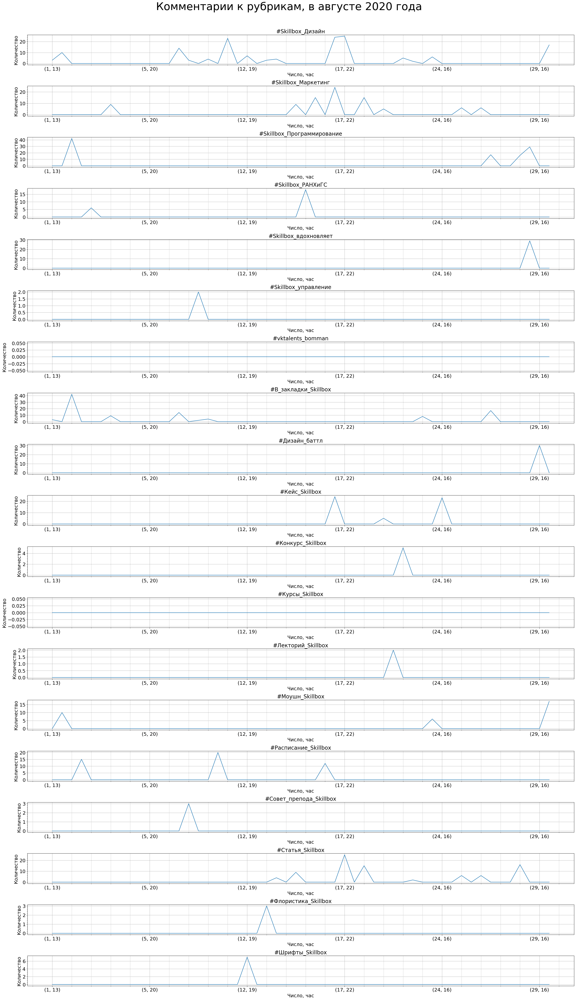

In [74]:
#Анализируем комментарии.
plt.style.use('default')
fig,axes = plt.subplots(19, 1 , sharex=False, squeeze=False, figsize=(30,50))
for ax, num in zip(axes.ravel(), range(0, 19)):
    df_temp_c = df_sb_aug_dat_tag_comm[df_sb_aug_dat_tag_comm.columns[num]]
    ax.set_title(df_temp_c.name[1], fontsize=20)
    plt.tight_layout()
    df_temp_c.plot(ax=ax, fontsize=18)
    ax.set_ylabel('Количество', fontsize=18)
    ax.set_xlabel('Число, час', fontsize=18)
    ax.grid()
    ax.minorticks_on()
    ax.xaxis.grid(True, which='minor', color = 'gray', linestyle = ':')
fig.suptitle('Комментарии к рубрикам, в августе 2020 года', fontsize=40, y=1.025)
plt.show()

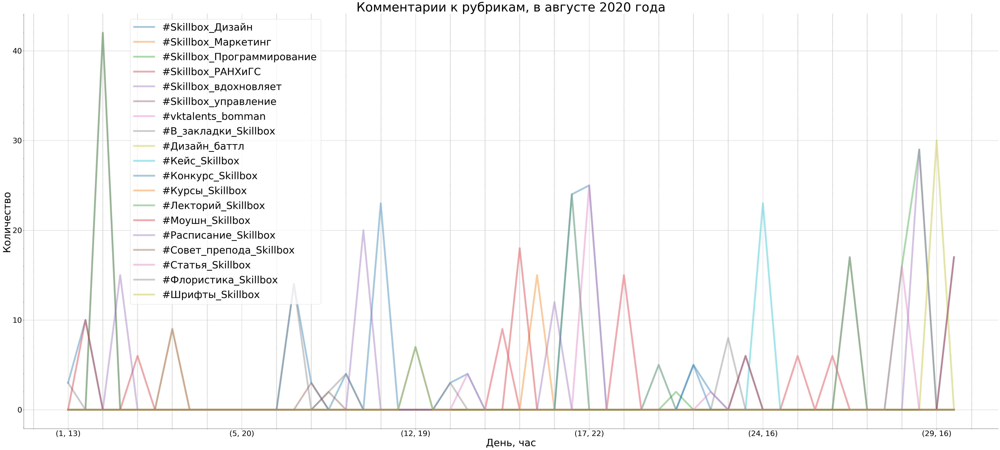

In [75]:
plot = df_sb_aug_dat_tag_comm.plot(
        figsize=(70,30)
        , linewidth=7
        , alpha = 0.4
        , fontsize=30
        , title='Комментарии к рубрикам, в августе 2020 года')
plot.title.set_size(50)
handles, labels = plot.get_legend_handles_labels()
names = []
for name in labels:
    names.append(re.findall(r'(#\w+)', name)[0])
plot.legend(labels=names, loc=1, bbox_to_anchor=(0.31, 1), fontsize=40)
plt.ylabel('Количество', fontsize=40)
plt.xlabel('День, час', fontsize=40)
plot.grid()
plot.minorticks_on()
plot.xaxis.grid(True, which='minor', color = 'black', linestyle = ':')
sns.despine(top=True, right=True)
plt.show()

Особенно активны читатели рубрик "Дизайн" и "Маркетинг". Мало активны читатели рубрик: "Шрифты", "Флористика", "Совет_препода", "Лекторий", "Конкурс", "Управление" - меньше 10 комментариев. И совсем аппатичны: "Курсы", "vktalents_bomman" - 0 комментариев.

На общем графике видно, что 2 августа были опубликованы статьи, с тэгами "Программирование" и "В_закладки", которые получили широкий отклик среди читателей (40 комментариев). В период 3-6 августа не было опубликованно ничего, что бы вызвало желание обсуждать. И 28-29 августа размещены стать в рубриках "Вдохновляет" и "Дизайн_баттл", собравших по 30 комментариев. В остальном, картина, более-менее, монотонна.

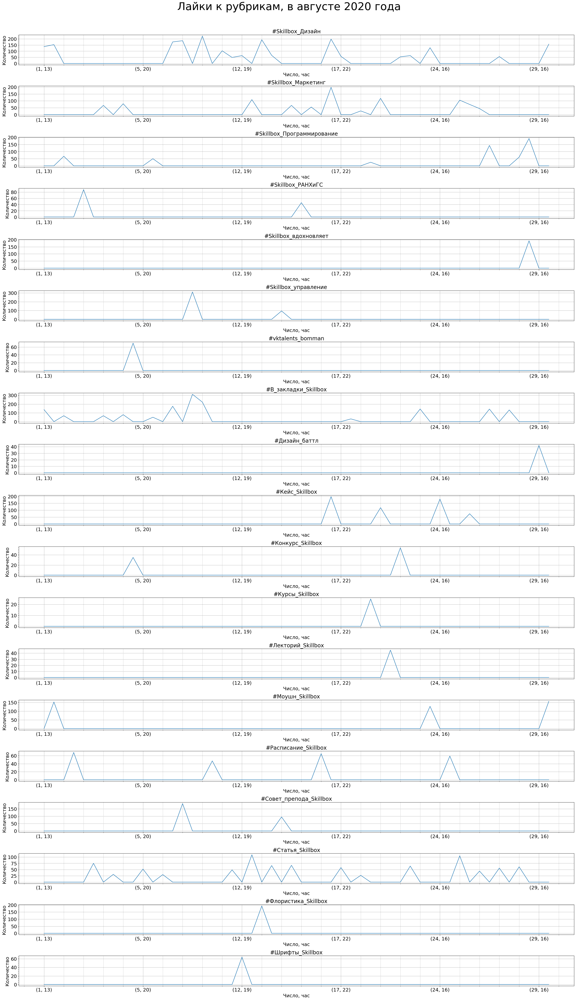

In [76]:
#Исследуем лайки.
fig,axes = plt.subplots(19, 1 , sharex=False, squeeze=False, figsize=(30,50))
for ax, num in zip(axes.ravel(), range(0, 19)):
    df_temp_l = df_sb_aug_dat_tag_likes[df_sb_aug_dat_tag_likes.columns[num]]
    ax.set_title(df_temp_l.name[1], fontsize=20)
    plt.tight_layout()
    df_temp_l.plot(ax=ax, fontsize=18)
    ax.set_ylabel('Количество', fontsize=18)
    ax.set_xlabel('Число, час', fontsize=18)
    ax.grid()
    ax.minorticks_on()
    ax.xaxis.grid(True, which='minor', color = 'gray', linestyle = ':')
fig.suptitle('Лайки к рубрикам, в августе 2020 года', fontsize=40, y=1.025)
plt.show()

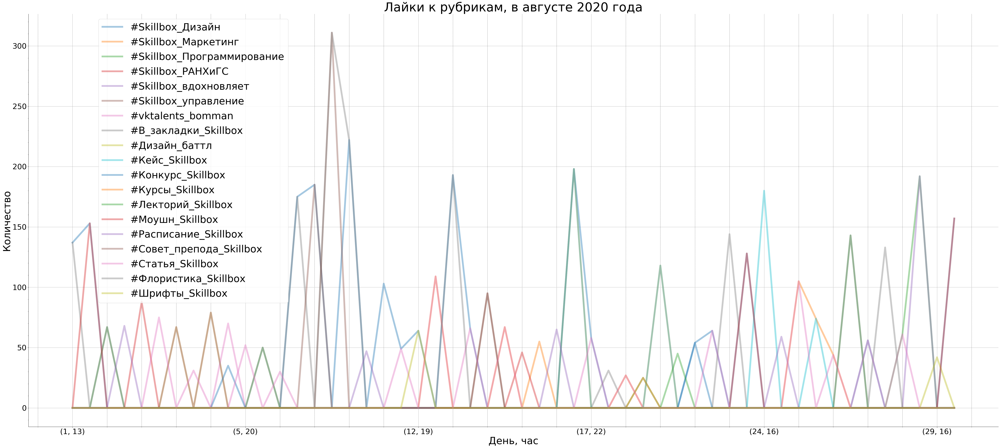

In [77]:
plot = df_sb_aug_dat_tag_likes.plot(
        figsize=(70,30)
        , linewidth=7
        , alpha = 0.4
        , fontsize=30
        , title='Лайки к рубрикам, в августе 2020 года')
plot.title.set_size(50)
handles, labels = plot.get_legend_handles_labels()
names = []
for name in labels:
    names.append(re.findall(r'(#\w+)', name)[0])
plot.legend(labels=names, loc=1, bbox_to_anchor=(0.273, 1), fontsize=40)
plt.ylabel('Количество', fontsize=40)
plt.xlabel('День, час', fontsize=40)
plot.grid()
plot.minorticks_on()
plot.xaxis.grid(True, which='minor', color = 'black', linestyle = ':')
sns.despine(top=True, right=True)
plt.show()

Высокая активность наблюдается в рубриках: "Дизайн", "Маркетинг", "В закладки", "Статья". Низкая - "Курсы".

На общем графике вид однородный, с выбросом 6-10 августа, в рубриках: "Дизайн", "Управление", "В закладки", "Совет_препода".

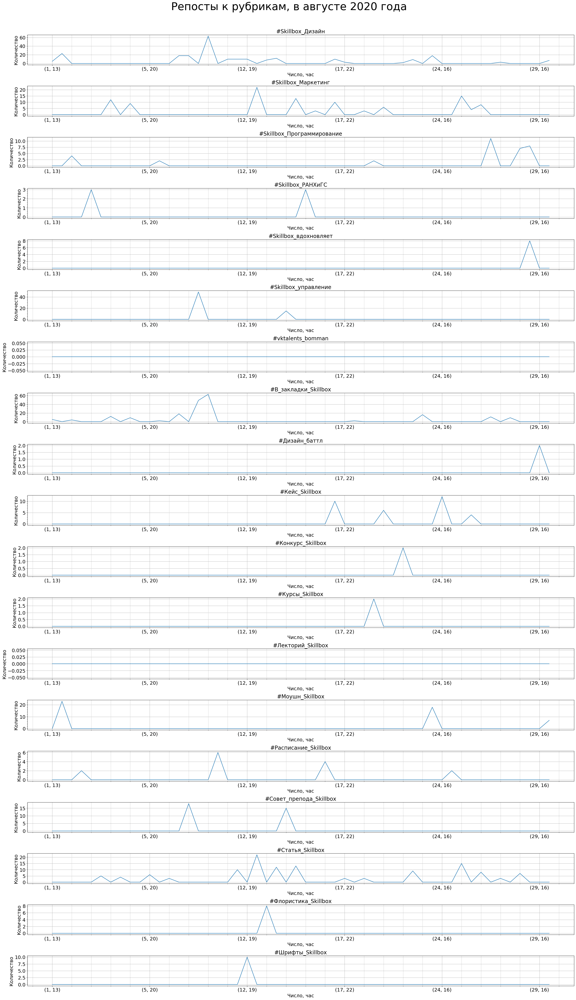

In [78]:
#Исследуем репосты.
fig,axes = plt.subplots(19, 1 , sharex=False, squeeze=False, figsize=(30,50))
for ax, num in zip(axes.ravel(), range(0, 19)):
    df_temp_r = df_sb_aug_dat_tag_rep[df_sb_aug_dat_tag_rep.columns[num]]
    ax.set_title(df_temp_r.name[1], fontsize=20)
    plt.tight_layout()
    df_temp_r.plot(ax=ax, fontsize=18)
    ax.set_ylabel('Количество', fontsize=18)
    ax.set_xlabel('Число, час', fontsize=18)
    ax.grid()
    ax.minorticks_on()
    ax.xaxis.grid(True, which='minor', color = 'gray', linestyle = ':')
fig.suptitle('Репосты к рубрикам, в августе 2020 года', fontsize=40, y=1.025)
plt.show()

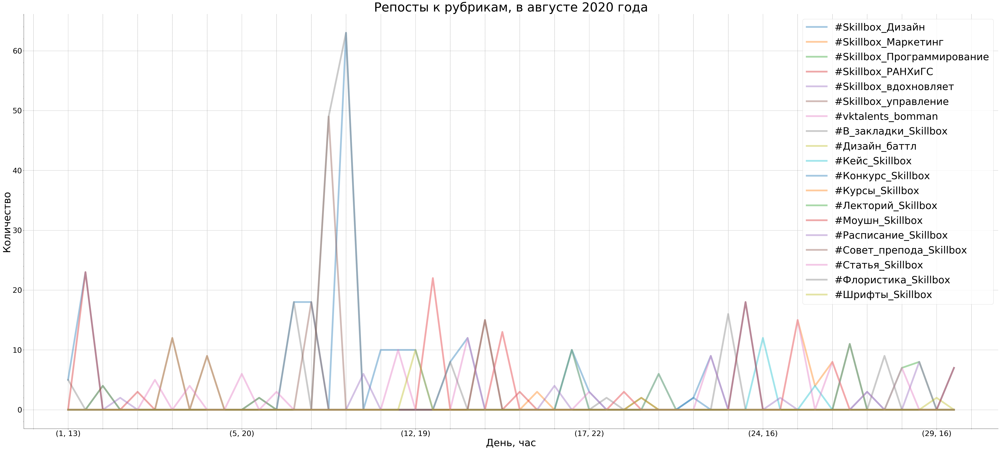

In [79]:
plot = df_sb_aug_dat_tag_rep.plot(
        figsize=(70,30)
        , linewidth=7
        , alpha = 0.4
        , fontsize=30
        , title='Репосты к рубрикам, в августе 2020 года')
plot.title.set_size(50)
handles, labels = plot.get_legend_handles_labels()
names = []
for name in labels:
    names.append(re.findall(r'(#\w+)', name)[0])
plot.legend(labels=names, loc=1, bbox_to_anchor=(1, 1), fontsize=40)
plt.ylabel('Количество', fontsize=40)
plt.xlabel('День, час', fontsize=40)
plot.grid()
plot.minorticks_on()
plot.xaxis.grid(True, which='minor', color = 'black', linestyle = ':')
sns.despine(top=True, right=True)
plt.show()

Сильное желание поделиться, замечено в рубриках: "Дизайн", "Маркетинг", "Статья". Не сильное: "РАНХиГС", "Вдохновляет", "Дизайн_баттл", "Конкурс", "Флористика" (меньше 10 репостов). И совсем никому не интересно: "Лекторий", "vktalents_bomman".  

На общем графике, опять, виден выброс 6-10 августа, в рубриках: "Дизайн", "Управление", "В закладки".

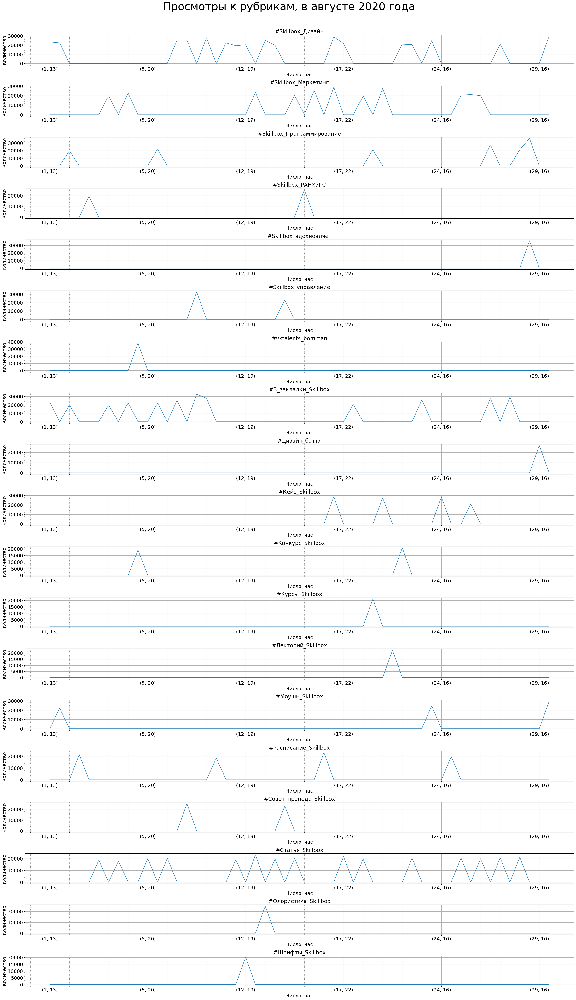

In [80]:
#Посмотрим на просмотры.
fig,axes = plt.subplots(19, 1 , sharex=False, squeeze=False, figsize=(30,50))
for ax, num in zip(axes.ravel(), range(0, 19)):
    df_temp_v = df_sb_aug_dat_tag_views[df_sb_aug_dat_tag_views.columns[num]]
    ax.set_title(df_temp_v.name[1], fontsize=20)
    plt.tight_layout()
    df_temp_v.plot(ax=ax, fontsize=18)
    ax.set_ylabel('Количество', fontsize=18)
    ax.set_xlabel('Число, час', fontsize=18)
    ax.grid()
    ax.minorticks_on()
    ax.xaxis.grid(True, which='minor', color = 'gray', linestyle = ':')
fig.suptitle('Просмотры к рубрикам, в августе 2020 года', fontsize=40, y=1.025)
plt.show()

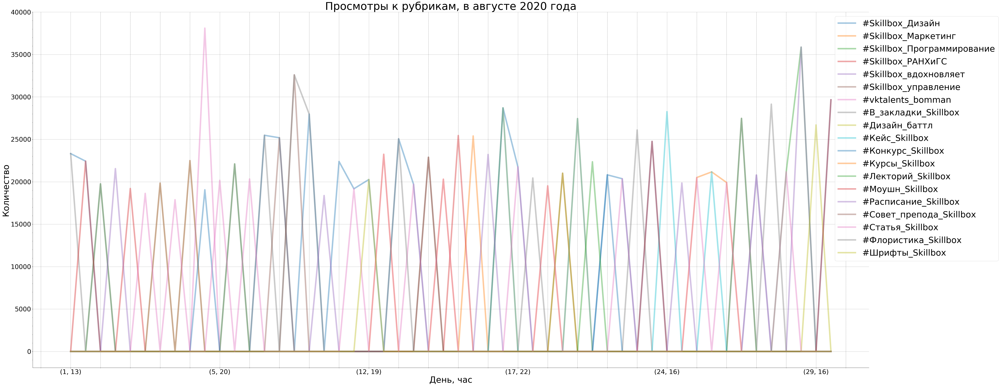

In [81]:
plot = df_sb_aug_dat_tag_views.plot(
        figsize=(70,30)
        , linewidth=7
        , alpha = 0.4
        , fontsize=30
        , title='Просмотры к рубрикам, в августе 2020 года')
plot.title.set_size(50)
handles, labels = plot.get_legend_handles_labels()
names = []
for name in labels:
    names.append(re.findall(r'(#\w+)', name)[0])
plot.legend(labels=names, loc=1, bbox_to_anchor=(1.16, 1), fontsize=40)
plt.ylabel('Количество', fontsize=40)
plt.xlabel('День, час', fontsize=40)
plot.grid()
plot.minorticks_on()
plot.xaxis.grid(True, which='minor', color = 'black', linestyle = ':')
sns.despine(top=True, right=True)
plt.show()

Высокая активность: "Дизайн", "Маркетинг", "В_закладки", "Статья". Аутсайдерами можно назвать: "Шрифты", "Курсы".


На общем графике, особо выделяющихся рубрик, нет.

### Выводы:
#### Влияние различных факторов:
- Чаще всего читатели просматривают сообщество Skillbox в обед (13:00-14:00) и послерабочее время (19:00-20:00). Для наибольшего количества просмотров, следует использовать это время, для размещения новых материалов.  
- Общительность, временем суток не ограничивается.  
- Была проверена гипотеза о зависимости просмотров от репостов - выяснилось, что эти две величины связаны слабо.  

#### Аналитика по рубрикам:
- Для более корректной работы системы, требуется внедрить автоматизированное прикрепление тэгов.  
- Самые активные читатели, по всем показателям, в рубриках "Дизайн" и "Маркетинг"; на некотором отдалении от них расположились читатели рубрик "В_закладки" и "Статья".  
- Стоит поработать над рубриками: "Шрифты", "Флористика", "Конкурс", "Курсы".
- Самого пристального внимания требует рубрика "vktalents_bomman".
- 6-10 августа, в рубриках: "Дизайн", "Управление", "В закладки" - размещались статьи вызвавшие всплеск интереса. Возможно стоит их проанализировать и распространить этот опыт на другие рубрики.